<h1> Yolo V3 Facial Anatomy Detection </h1>
<h3> By Edwin Tembo</h3>

This example uses custom Yolo v3 weights to do  frame By frame object detection of  5 facial anatomy features,  face, mouth , nose, ear and eye. The model is also trained to detect human faces and people in images. I personally annotated the images and trained the model using a third
party annotation and model training tool, using existing weights for transfer learning. An example of an output frame is provided and can be displayed in the notebook. The quality of the output can be improved or customized as needed. A sample target video and corresponding sample output video is also provided, however this should work with any .mp4 file that can fit on disk and can be handled by the available memory. Other video formats like .avi can also be used with some slight changes in the code.

I initially did this as an exploratory project in 2020, using Yolo v3 but have recently updated it to accomodate the changes in the current openCV library.

Use GPU's for best perfomance. Works with T4, V100 and A100

**If you indend to view/save the output images and vidoes, do not run the last two cells until the output is saved. Run each individual cell in order.**


In [1]:
from IPython.display import HTML
from base64 import b64encode
import re
from google.colab.patches import cv2_imshow
import cv2
import os
import asyncio


In [2]:
!git clone "https://github.com/edtemboml/77yh8932yt765n"

Cloning into '77yh8932yt765n'...
remote: Enumerating objects: 39, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 39 (delta 0), reused 5 (delta 0), pack-reused 33
Receiving objects: 100% (39/39), 108.88 MiB | 16.04 MiB/s, done.
Resolving deltas: 100% (3/3), done.


<h2>Displaying the Sample Output</h2>
All Images and Videos used are Courtesy of www.pixels.com.



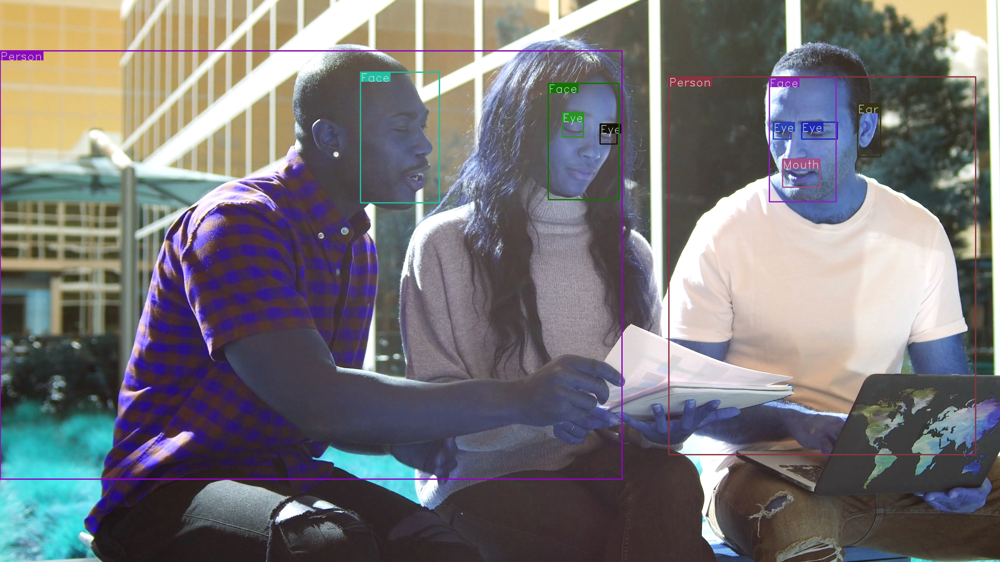

In [3]:


image = cv2.imread("/content/77yh8932yt765n/Machine_Learning/Object_Detection/yolo_video/yolo_v3/sample_output_frame.jpg")
cv2_imshow(image)

**Use your own video or the one provided in the example.**

In [ ]:
## Video Source pixels.com - Free Video
## Attempt to view the original if memory is available; otherwise optional tends.
## Can crash  by is not necessary


##Uncomment this code to run the video here
# mp4 = open('/content/drive/MyDrive/Project History/Yolo_Gen_Video/target_video.mp4','rb').read()
# data_url = "data:/content/drive/MyDrive/Project History/Yolo_Gen_Video/target_video.mp4;base64," + b64encode(mp4).decode()

# HTML("""
# <video width=400 controls>
#       <source src="%s" type="video/mp4">
# </video>
# """ % data_url)


<b>Create Directories to save files deleting existing files.</b>

**Run Infererence**

*   Create Directories to save files,  deleting any existing files.

*   Tune the confidence accordingly, this is a probability threshold used to determine whether the bounding box should appear. The higher the value the more stringent.
*  Reso - Higher reso impoves accuracy but reduces processing speed. Must be a multiple of 32
* Change all other arguments to point to the correct path.See Help for details.



Try downloading and unzipping the weights file here : https://drive.google.com/drive/folders/1cfazVSCJaELXerIZCsn6wcXZZuKelZKS
contact me if it doesn't work. Alternatively, try using the google_drive_downloader code below.

In [15]:
# from google_drive_downloader import GoogleDriveDownloader as gdd

# gdd.download_file_from_google_drive(file_id='THE_GD_FILE_ID',
#                                     dest_path='/content/model.weights',
#                                     unzip=True)

##

Unzipping...

In [19]:
## Displays FPS after every 10 images processed.
! rm -r '/content/bbox_images'
! mkdir '/content/bbox_images'
! rm -r '/content/bbox_videos'
! mkdir '/content/bbox_videos'

%env WORKING_DIR =/content/77yh8932yt765n/Machine_Learning/Object_Detection/yolo_video/yolo_v3
%env WEIGHTS      =/content/weights_faces_model/weights_faces_model/model.weights
! python $WORKING_DIR/video_human_face.py --working_dir=$WORKING_DIR --video=$WORKING_DIR/target_video.mp4 --test_img=$WORKING_DIR/test_img.jpg --confidence=0.4 --reso=832  --weights=$WEIGHTS --cfg=$WORKING_DIR/cfg_faces_model/model.cfg

env: WORKING_DIR=/content/77yh8932yt765n/Machine_Learning/Object_Detection/yolo_video/yolo_v3
env: WEIGHTS=/content/weights_faces_model/weights_faces_model/model.weights
Loading network.....
Network successfully loaded
FPS of the video is 0.36997596768320384
FPS of the video is 0.37815692559785585
FPS of the video is 0.3807229603484052
FPS of the video is 0.3786486193702751
FPS of the video is 0.37737002939351905
FPS of the video is 0.3753666109064511
FPS of the video is 0.37336719090934717
FPS of the video is 0.37076135704215574
FPS of the video is 0.36877881461217876
FPS of the video is 0.36888064364672646
FPS of the video is 0.3667964557440722
FPS of the video is 0.36428080642662247
FPS of the video is 0.36192907688092923
FPS of the video is 0.36075859849748826
FPS of the video is 0.3616483206840073
FPS of the video is 0.36396267606363375
FPS of the video is 0.3660195124843688
FPS of the video is 0.3684884030073581
FPS of the video is 0.3710066535597175
FPS of the video is 0.3723023

**To create a video, frames must be in the order they are processed**

In [20]:
image_folder = '/content/bbox_images'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]

def sort_keys(s, re_out=re.compile('([0-9]+)')):
    return [int(val) if val.isdigit() else val.lower() for val in re_out.split(s)]

sorted_images = sorted(images, key=sort_keys)

print('###image order check ######')
print(sorted_images[0:10])
print(sorted_images[-10:])

###image order check ######
['inf_im1.png', 'inf_im2.png', 'inf_im3.png', 'inf_im4.png', 'inf_im5.png', 'inf_im6.png', 'inf_im7.png', 'inf_im8.png', 'inf_im9.png', 'inf_im10.png']
['inf_im298.png', 'inf_im299.png', 'inf_im300.png', 'inf_im301.png', 'inf_im302.png', 'inf_im303.png', 'inf_im304.png', 'inf_im305.png', 'inf_im306.png', 'inf_im307.png']


**Create the Video. Be sure to use the correct codec for the desired output format. We're using mp4 in this case.**

In [21]:
###convert images to video
images = sorted_images
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video_name   = '/content/bbox_videos/result_video_office.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter(video_name, fourcc, 24, (width,height))


for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

**Attemp to view the saved video or Downlaod to local machine. Once downloaded cleanup or terminate Colab VM**

In [ ]:
##Clean up the images and videos
def cleanup():
  !rm -r /content/bbox_images
  !rm -r /content/bbox_videos

In [ ]:
##uncomment to cleanup
##cleanup()

rm: cannot remove '/content/bbox_videos': No such file or directory
